<a href="https://colab.research.google.com/github/Lianasy/Machine-Lerning-labs/blob/main/lab2_ml.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, classification_report
from sklearn.preprocessing import StandardScaler

In [ ]:
train = pd.read_csv("application_train.csv")
test = pd.read_csv("application_test.csv")
print(train.shape, test.shape)
train.head()

(307511, 122) (48744, 121)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
test.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
train.sample(10)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
231153,367734,0,Cash loans,M,Y,Y,2,225000.0,900000.0,46084.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
160852,286468,0,Revolving loans,F,N,N,0,112500.0,225000.0,11250.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
62496,172472,0,Cash loans,F,N,N,0,292500.0,2250000.0,59485.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4213,104929,0,Cash loans,M,N,N,0,112500.0,454500.0,16695.0,...,0,0,0,0,0.0,0.0,0.0,5.0,0.0,2.0
18667,121767,0,Cash loans,M,Y,N,0,157500.0,331632.0,30685.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
53598,162083,0,Cash loans,M,Y,Y,2,157500.0,837000.0,24471.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
82608,195804,0,Cash loans,M,Y,Y,1,144000.0,278460.0,25668.0,...,0,0,0,0,0.0,0.0,1.0,0.0,0.0,4.0
75012,186996,0,Cash loans,F,N,N,0,202500.0,450000.0,11871.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
288795,434570,0,Revolving loans,F,N,Y,0,112500.0,270000.0,13500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
256093,396328,0,Revolving loans,F,N,Y,0,292500.0,292500.0,14625.0,...,0,0,0,0,0.0,0.0,0.0,0.0,2.0,6.0


In [ ]:
test.sample(10)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
36452,366725,Cash loans,F,N,Y,1,112500.0,817560.0,29493.0,675000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
28134,305261,Cash loans,F,N,N,0,135000.0,364428.0,15448.5,238500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
32989,340416,Cash loans,F,N,N,0,90000.0,225000.0,20637.0,225000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,2.0
36371,366214,Cash loans,M,N,N,0,193500.0,450000.0,35554.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
11393,182742,Cash loans,F,N,N,1,270000.0,761872.5,54310.5,675000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
35438,359387,Cash loans,M,N,Y,0,112500.0,172021.5,17757.0,148500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
34338,350724,Cash loans,F,N,Y,0,292500.0,1800000.0,56002.5,1800000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
5475,139989,Cash loans,F,N,N,0,49500.0,76500.0,3676.5,76500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,2.0
24775,280426,Cash loans,F,N,Y,1,157500.0,360000.0,18508.5,360000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
3463,124423,Cash loans,F,N,N,1,225000.0,900000.0,45954.0,900000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0


In [ ]:
data_uniq = pd.concat([train.nunique(),train.dtypes, test.nunique(), test.dtypes], axis=1)
data_uniq.columns = ['Train uniq', 'Train types', 'Test uniq', 'Test types']
data_uniq

,Train uniq,Train types,Test uniq,Test types
SK_ID_CURR,307511,int64,48744.0,int64
TARGET,2,int64,NaN,NaN
NAME_CONTRACT_TYPE,2,object,2.0,object
CODE_GENDER,3,object,2.0,object
FLAG_OWN_CAR,2,object,2.0,object
...,...,...,...,...
AMT_REQ_CREDIT_BUREAU_DAY,9,float64,3.0,float64
AMT_REQ_CREDIT_BUREAU_WEEK,9,float64,3.0,float64
AMT_REQ_CREDIT_BUREAU_MON,24,float64,7.0,float64
AMT_REQ_CREDIT_BUREAU_QRT,11,float64,8.0,float64


In [ ]:
train.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [ ]:
test.describe()

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,0.014428,4325.900393,144348.507136,3552.612035,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,-25195.000000,-17463.000000,-23722.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,-19637.000000,-2910.000000,-7459.250000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,0.018850,-15785.000000,-1293.000000,-4490.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,-12496.000000,-296.000000,-1901.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
max,456250.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,-7338.000000,365243.000000,0.000000,...,1.000000,0.0,0.0,0.0,2.000000,2.000000,2.000000,6.000000,7.000000,17.000000


In [ ]:
train.describe(include=['object'])

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,307511,307511,307511,307511,306219,307511,307511,307511,307511,211120,307511,307511,97216,153214,151170,161756
unique,2,3,2,2,7,8,5,6,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,278232,202448,202924,213312,248526,158774,218391,196432,272868,55186,53901,67992,73830,150503,66040,159428


In [ ]:
test.describe(include=['object'])

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,48744,48744,48744,48744,47833,48744,48744,48744,48744,33139,48744,48744,15947,25125,24851,26535
unique,2,2,2,2,7,7,5,5,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,48305,32678,32311,33658,39727,24533,33988,32283,43645,8655,9751,10840,12124,24659,11269,26179


In [ ]:
# Concatenate the percentage of missing values in train and test datasets
data_missing = pd.concat([((train.isnull().sum() / len(train)) * 100),
                          ((test.isnull().sum() / len(test)) * 100)], axis=1)

# Rename the columns for clarity
data_missing.columns = ['Train', 'Test']

# Display the DataFrame showing the percentage of missing values in both datasets
data_missing

,Train,Test
SK_ID_CURR,0.000000,0.000000
TARGET,0.000000,NaN
NAME_CONTRACT_TYPE,0.000000,0.000000
CODE_GENDER,0.000000,0.000000
FLAG_OWN_CAR,0.000000,0.000000
...,...,...
AMT_REQ_CREDIT_BUREAU_DAY,13.501631,12.409732
AMT_REQ_CREDIT_BUREAU_WEEK,13.501631,12.409732
AMT_REQ_CREDIT_BUREAU_MON,13.501631,12.409732
AMT_REQ_CREDIT_BUREAU_QRT,13.501631,12.409732


In [ ]:
# Identify categorical columns
categorical_columns = train.select_dtypes(include=['object', 'category']).columns.tolist()

# Identify numeric columns
numeric_columns = train.select_dtypes(exclude=['object', 'category']).columns.tolist()

# Identify numeric columns  to convert to categorical
numeric_columns_to_categorical = [col for col in numeric_columns if train[col].nunique() <= 3 and col != 'TARGET']

# Extend categorical columns with columns that should be treated as categorical
categorical_columns.extend(numeric_columns_to_categorical)

# Remove numeric columns that should be treated as categorical from the list of numeric columns
numeric_columns = [col for col in numeric_columns if col not in numeric_columns_to_categorical]

# Remove 'SK_ID_CURR' if it exists in the numeric columns
if 'SK_ID_CURR' in numeric_columns:
    numeric_columns.remove('SK_ID_CURR')

# Display the final list of numeric columns
numeric_columns

['TARGET',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'CNT_FAM_MEMBERS',
 'HOUR_APPR_PROCESS_START',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 '

In [ ]:
# Display the final list of categorical columns
categorical_columns

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_

In [ ]:
# Convert columns in the training dataset to categorical type
train[categorical_columns] = train[categorical_columns].astype('category')

# Convert columns in the test dataset to categorical type
test[categorical_columns] = test[categorical_columns].astype('category')

In [ ]:
# Concatenate the number of unique values and data types of columns for both train and test datasets
data_uniq = pd.concat([train.nunique(), train.dtypes, test.nunique(), test.dtypes], axis=1)

# Set column names for the concatenated dataframe
data_uniq.columns = ['Train uniq', 'Train types', 'Test uniq', 'Test types']

# Display the concatenated dataframe
data_uniq

,Train uniq,Train types,Test uniq,Test types
SK_ID_CURR,307511,int64,48744.0,int64
TARGET,2,int64,NaN,NaN
NAME_CONTRACT_TYPE,2,category,2.0,category
CODE_GENDER,3,category,2.0,category
FLAG_OWN_CAR,2,category,2.0,category
...,...,...,...,...
AMT_REQ_CREDIT_BUREAU_DAY,9,float64,3.0,float64
AMT_REQ_CREDIT_BUREAU_WEEK,9,float64,3.0,float64
AMT_REQ_CREDIT_BUREAU_MON,24,float64,7.0,float64
AMT_REQ_CREDIT_BUREAU_QRT,11,float64,8.0,float64


# DATA VISUALISATION

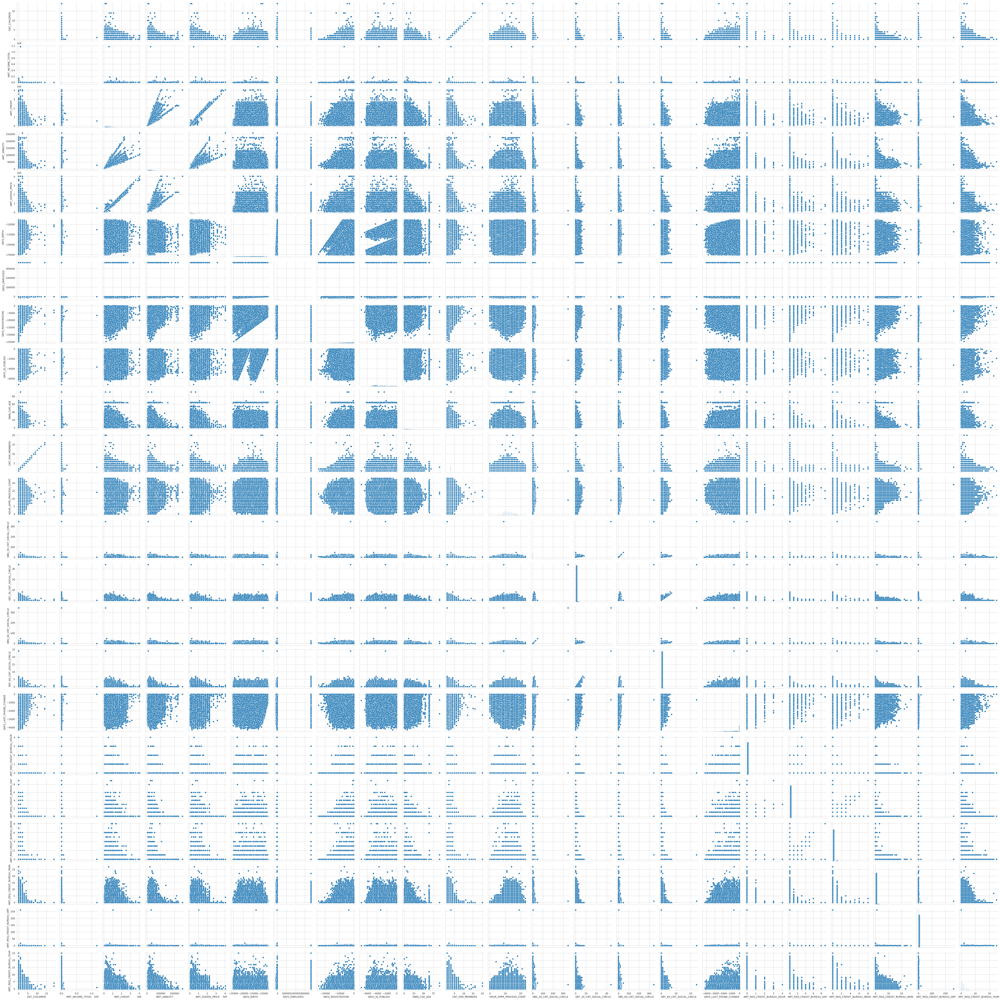

In [ ]:
sns.set_style("whitegrid")
sns.pairplot(train[numeric_columns])
plt.show()

<Axes: >

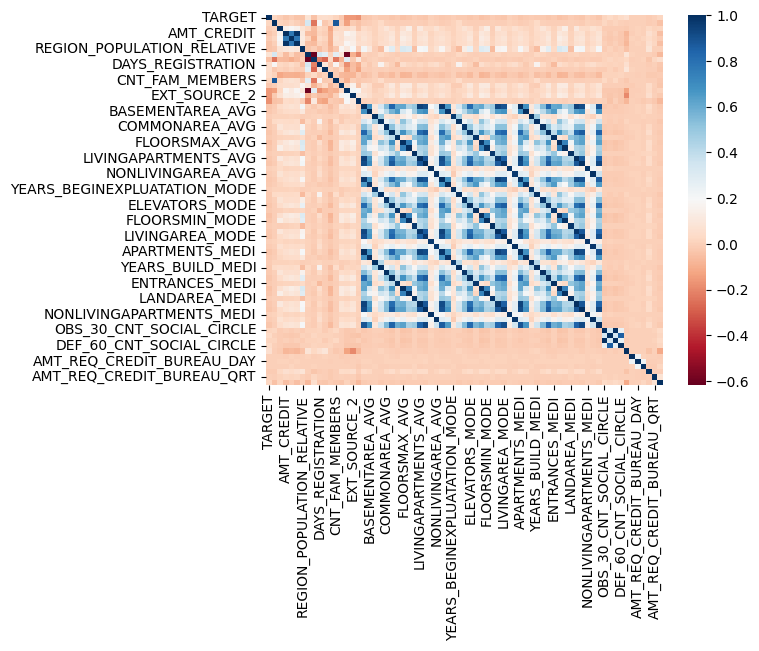

In [ ]:
sns.heatmap(train[numeric_columns].corr(), cmap='RdBu')

array([[<Axes: title={'center': 'TARGET'}>,
        <Axes: title={'center': 'CNT_CHILDREN'}>,
        <Axes: title={'center': 'AMT_INCOME_TOTAL'}>,
        <Axes: title={'center': 'AMT_CREDIT'}>,
        <Axes: title={'center': 'AMT_ANNUITY'}>,
        <Axes: title={'center': 'AMT_GOODS_PRICE'}>,
        <Axes: title={'center': 'REGION_POPULATION_RELATIVE'}>,
        <Axes: title={'center': 'DAYS_BIRTH'}>],
       [<Axes: title={'center': 'DAYS_EMPLOYED'}>,
        <Axes: title={'center': 'DAYS_REGISTRATION'}>,
        <Axes: title={'center': 'DAYS_ID_PUBLISH'}>,
        <Axes: title={'center': 'OWN_CAR_AGE'}>,
        <Axes: title={'center': 'CNT_FAM_MEMBERS'}>,
        <Axes: title={'center': 'HOUR_APPR_PROCESS_START'}>,
        <Axes: title={'center': 'EXT_SOURCE_1'}>,
        <Axes: title={'center': 'EXT_SOURCE_2'}>],
       [<Axes: title={'center': 'EXT_SOURCE_3'}>,
        <Axes: title={'center': 'APARTMENTS_AVG'}>,
        <Axes: title={'center': 'BASEMENTAREA_AVG'}>,
        <A

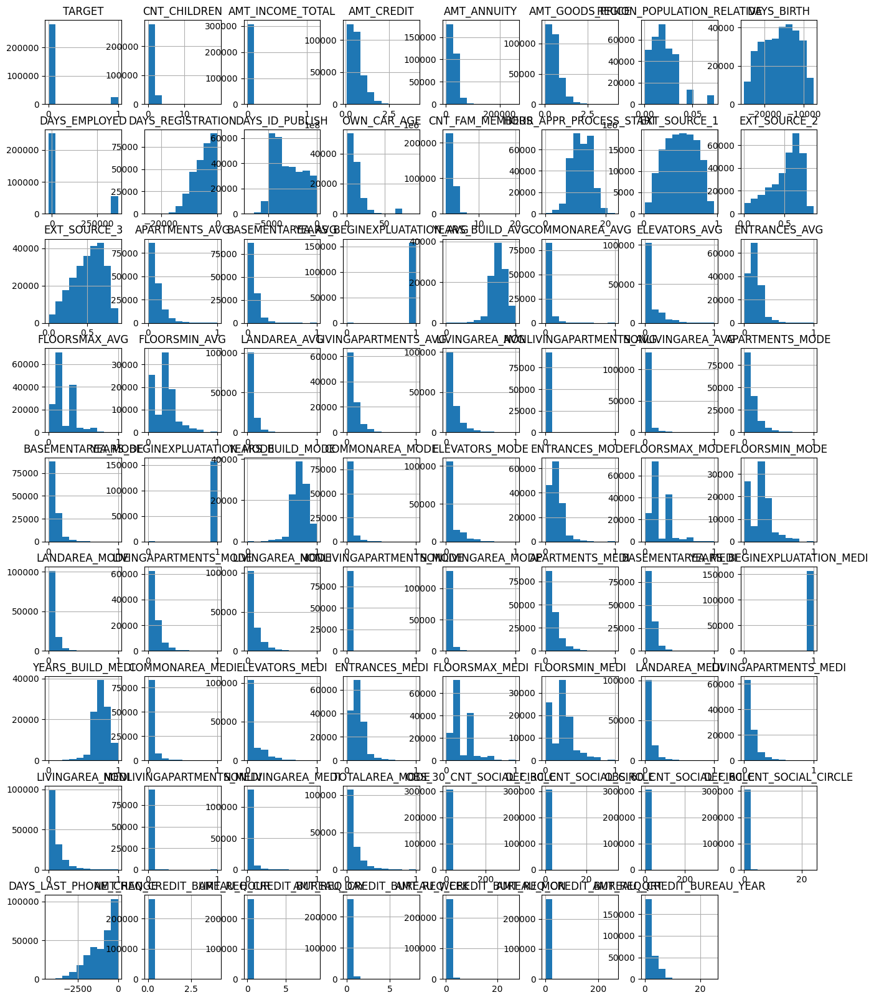

In [ ]:
train[numeric_columns].hist(figsize=(16, 20))

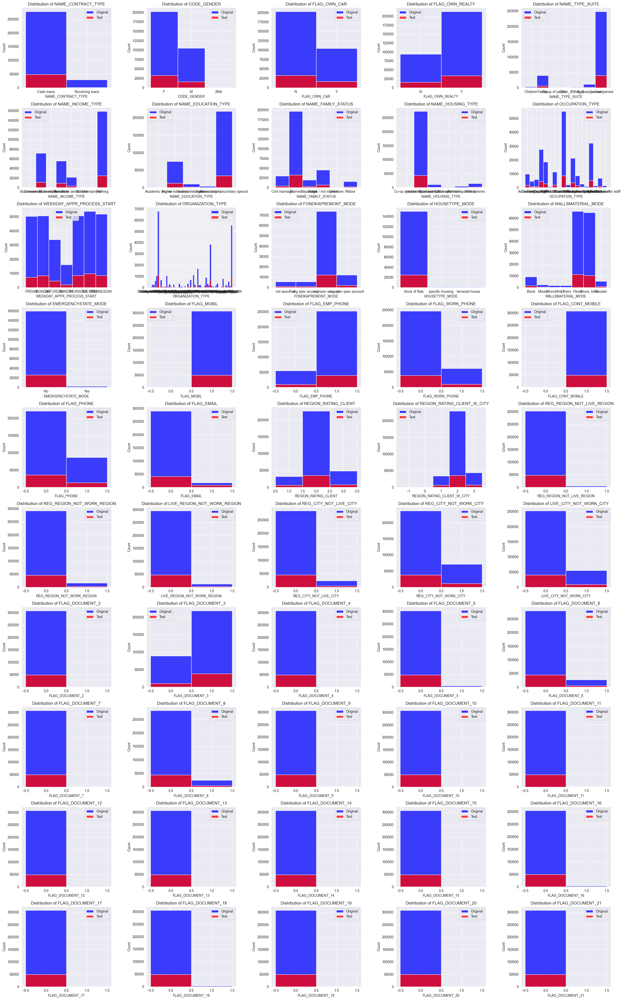

In [ ]:
ncols = 5
nrows = len(categorical_columns) // ncols
if len(categorical_columns) % ncols != 0:
    nrows += 1
fig, axs = plt.subplots(nrows, ncols, figsize=(ncols*5, nrows*4))
for col, ax in zip(categorical_columns, axs.ravel()):
    sns.histplot(train[col], kde=False, ax=ax, color='blue', label='Original')
    sns.histplot(test[col], kde=False, ax=ax, color='red', label='Test')
    ax.set_title(f'Distribution of {col}')
    ax.legend()

plt.tight_layout()
plt.show()

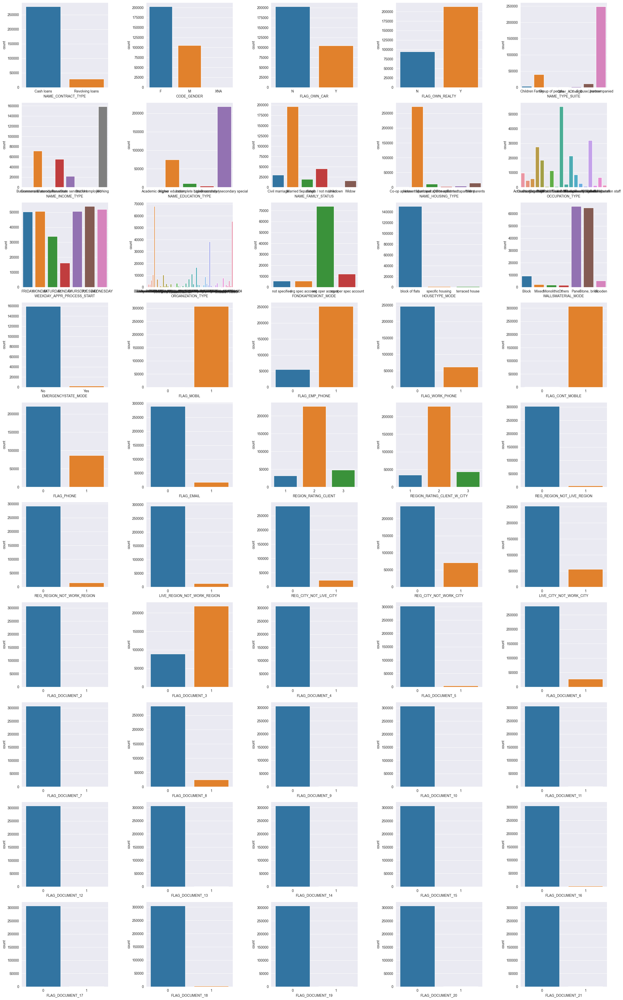

In [ ]:
ncols = 5
nrows = len(categorical_columns) // ncols
if len(categorical_columns) % ncols != 0:
    nrows += 1
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*5, nrows*4))

for i, col in enumerate(categorical_columns):
    sns.countplot(data=train, x=col, ax=axes[i//ncols, i%ncols])

plt.tight_layout()
plt.show()

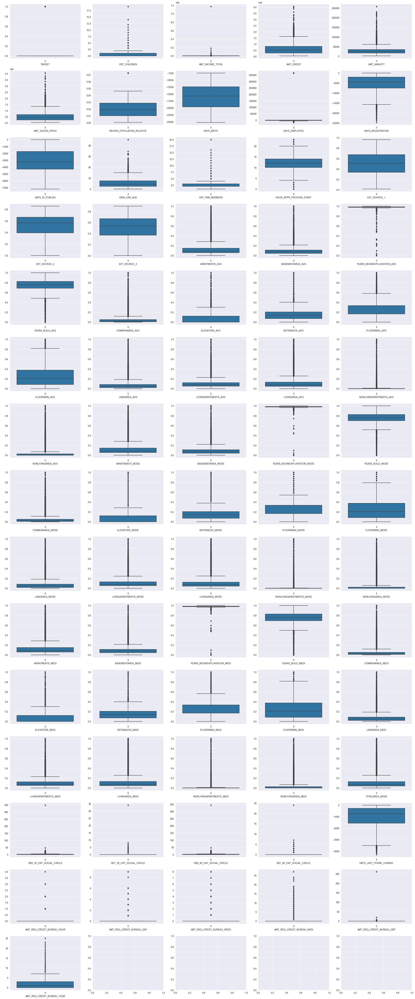

In [ ]:
ncols = 5
nrows = len(numeric_columns) // ncols
if len(numeric_columns) % ncols != 0:
    nrows += 1
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 5, nrows * 4))
for i, col in enumerate(numeric_columns):
    sns.boxplot(train[col], ax=axes[i // ncols, i % ncols])
    axes[i // ncols, i % ncols].set_xlabel(col)
plt.tight_layout()
plt.show()

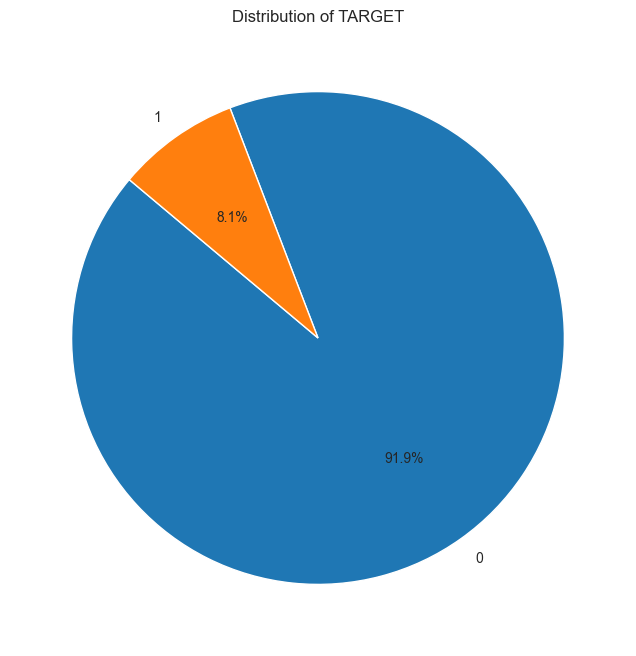

In [ ]:
target_counts = train['TARGET'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(target_counts, labels=target_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of TARGET')
plt.show()

# DATA PREPROCESSING


In [ ]:
def replace_missing_values(data):
    # Replacing missing values in numerical columns with column median
    numeric_columns = data.select_dtypes(include=['int', 'float']).columns
    for col in numeric_columns:
        median_value = data[col].median()
        data[col].fillna(median_value, inplace=True)

    # Replacing missing values in categorical columns with column mode
    categorical_columns = data.select_dtypes(include=['object', 'category']).columns
    for col in categorical_columns:
        mode_value = data[col].mode()[0]  # Getting the first element which is the mode
        data[col].fillna(mode_value, inplace=True)

    return data

In [ ]:
# Copying train to processed train dataframe
processed_train = train.copy()
# Applying the function to the processed_train DataFrame
processed_train = replace_missing_values(processed_train)
# Copying test to processed test dataframe
processed_test = test.copy()
# Applying the function to the processed_test DataFrame
processed_test = replace_missing_values(processed_test)
# Counting the number of missing values in each column
missing_values_count = processed_train.isnull().sum()
# Creating a DataFrame for submission with 'SK_ID_CURR' from the processed test data
submission = pd.DataFrame({
    'SK_ID_CURR': processed_test['SK_ID_CURR']
})
# Printing the results
missing_values_count

SK_ID_CURR                    0
TARGET                        0
NAME_CONTRACT_TYPE            0
CODE_GENDER                   0
FLAG_OWN_CAR                  0
                             ..
AMT_REQ_CREDIT_BUREAU_DAY     0
AMT_REQ_CREDIT_BUREAU_WEEK    0
AMT_REQ_CREDIT_BUREAU_MON     0
AMT_REQ_CREDIT_BUREAU_QRT     0
AMT_REQ_CREDIT_BUREAU_YEAR    0
Length: 122, dtype: int64

In [ ]:
# Removing duplicate rows
processed_train.drop_duplicates(inplace=True)
processed_test.drop_duplicates(inplace=True)

In [ ]:
# Computing the correlation matrix
correlation_matrix = processed_train.corr().abs()

# Creating a mask to remove the upper triangle of the correlation matrix
mask = correlation_matrix.apply(lambda x: x > 0.85)

# Removing one of the numerical columns in pairs with correlation greater than 0.85
columns_to_drop = set()
for col in correlation_matrix.columns:
    if col not in columns_to_drop:
        correlated_columns = correlation_matrix.loc[mask[col], col].index.tolist()
        columns_to_drop.update(correlated_columns[1:])

# Dropping the identified columns from the data
processed_train.drop(columns=columns_to_drop, inplace=True)
processed_test.drop(columns=columns_to_drop, inplace=True)

In [ ]:
processed_numeric_columns_train = processed_train.select_dtypes(exclude=['object', 'category']).columns.tolist()
processed_numeric_columns_test = processed_test.select_dtypes(exclude=['object', 'category']).columns.tolist()
processed_numeric_columns_train.remove('TARGET')
processed_train[processed_numeric_columns_train] = StandardScaler().fit_transform(processed_train[processed_numeric_columns_train])
processed_test[processed_numeric_columns_test] = StandardScaler().fit_transform(processed_test[processed_numeric_columns_test])

In [ ]:
processed_categorical_columns_train = processed_train.select_dtypes(include=['category']).columns.tolist()
processed_categorical_columns_test = processed_test.select_dtypes(include=['category']).columns.tolist()
# Perform one-hot encoding for categorical data
processed_train = pd.get_dummies(processed_train, columns=processed_categorical_columns_train, drop_first=True, dtype=int)
processed_test = pd.get_dummies(processed_test, columns=processed_categorical_columns_test, drop_first=True, dtype=int)

# Model Training

In [ ]:
processed_train.shape, processed_test.shape

((307511, 198), (48744, 184))

In [ ]:
# Determining the columns that are not in the test dataset, except for TARGET
columns_to_drop = [col for col in processed_train.columns if col != 'TARGET' and col not in processed_test.columns]
# Dropping the columns from the training dataset
processed_train.drop(columns=columns_to_drop, inplace=True)
# Dropping the 'SK_ID_CURR' column from the processed train data
processed_train.drop(columns=['SK_ID_CURR'], inplace=True)
# Dropping the 'SK_ID_CURR' column from the processed train data
processed_test.drop(columns=['SK_ID_CURR'], inplace=True)

In [ ]:
# Determining the columns that are not in the train dataset
columns_to_drop_test = [col for col in processed_test.columns if col not in processed_train.columns]
# Dropping the columns from the testing dataset
processed_test.drop(columns=columns_to_drop_test, inplace=True)

In [ ]:
# Define features (X) and target variable (y)
X = processed_train.drop(columns=['TARGET'])
y = processed_train['TARGET']

# Split the data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Display the shapes of train and validation sets
print("Shape of X_train:", X_train.shape)
print("Shape of X_val:", X_val.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_val:", y_val.shape)

Shape of X_train: (246008, 182)
Shape of X_val: (61503, 182)
Shape of y_train: (246008,)
Shape of y_val: (61503,)


In [ ]:
# Train the model with the best value of l1_ratio
model = LogisticRegression(penalty='elasticnet', C=1, class_weight='balanced', random_state=42, solver='saga', n_jobs=-1, l1_ratio=0.5, max_iter=500)

In [ ]:
model.fit(X_train, y_train)

In [ ]:
# Generate predictions on the validation set
y_pred = model.predict(X_val)

# Generate the classification report
report = classification_report(y_val, y_pred)

# Print the classification report
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.68      0.80     56554
           1       0.16      0.67      0.26      4949

    accuracy                           0.68     61503
   macro avg       0.56      0.68      0.53     61503
weighted avg       0.90      0.68      0.76     61503


In [ ]:
# Generate predictions on the validation set
y_pred_proba = model.predict_proba(X_val)[:, 1]

# Calculate ROC AUC
roc_auc = roc_auc_score(y_val, y_pred_proba)
print("ROC AUC Score:", roc_auc)

ROC AUC Score: 0.7432613020600198


# Generating Predictions

In [ ]:
y_test_pred_proba = model.predict_proba(processed_test)[:, 1]
# Adding the predicted probabilities to the existing submission DataFrame
submission['TARGET'] = y_test_pred_proba
submission.to_csv('submission.csv', index=False)
submission

,SK_ID_CURR,TARGET
0,100001,0.376571
1,100005,0.788534
2,100013,0.337129
3,100028,0.336206
4,100038,0.652970
...,...,...
48739,456221,0.282966
48740,456222,0.401658
48741,456223,0.332767
48742,456224,0.420656


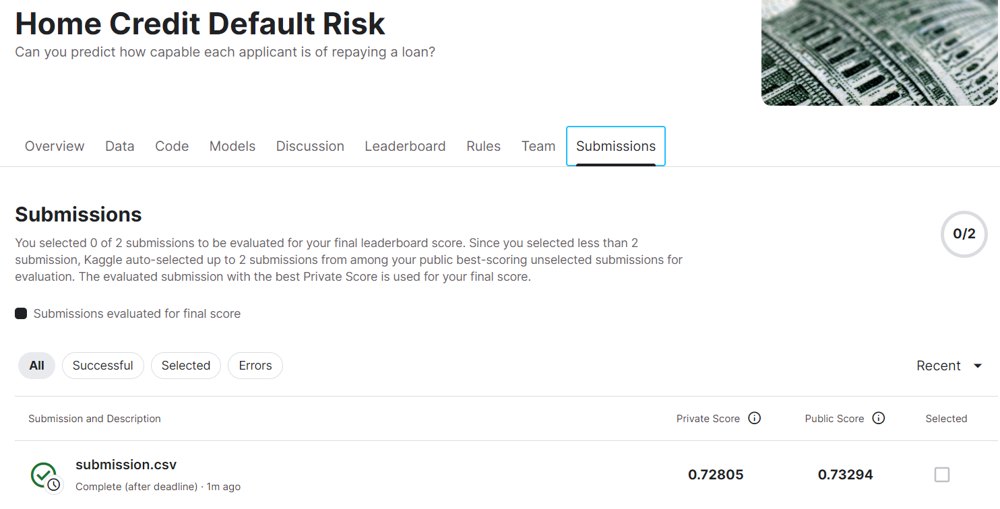# Result
![result](result.png)
